In [34]:
# import training and testing functions from model.py
# the model is imported then from mode.py
from mode import *
from inspect_data import *
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd
import os


low resolution images : 
shapes :  [[96 96  3]]
all_of_same_shape :  True
high resolution images : 
shapes :  [[384 384   3]]
all_of_same_shape :  True


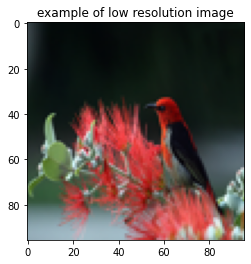

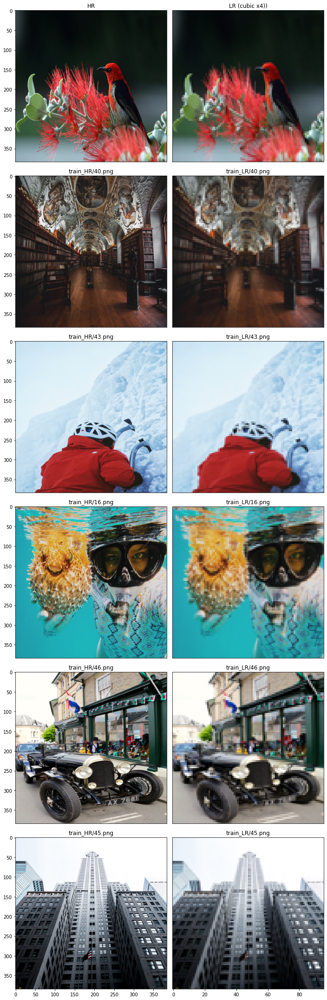

In [35]:
# inspect the dataset
inspect_data(HR_path = 'train_data/realistic_nature_100/train_HR/',
             LR_path = 'train_data/realistic_nature_100/train_LR/',
             type_end = '.png',
             sample_images = 6)

In [36]:
# arguments class for SRGAN model to make setting the parameters easier
class Args:
    '''
    arguments class for SRGAN model
    '''
    LR_path ='train_data/realistic_nature_100/train_LR/'
    GT_path = 'train_data/realistic_nature_100/train_HR/'
    res_num = 16
    num_workers = 0
    batch_size = 16
    L2_coeff = 1.0
    adv_coeff = 1e-3
    tv_loss_coeff = 0.0
    pre_train_epoch = 8000
    fine_train_epoch = 4000
    scale = 4
    patch_size = 24
    feat_layer = 'relu5_4'
    vgg_rescale_coeff = 0.006
    fine_tuning = False
    in_memory = True
    generator_path = ''
    mode = 'train'
    save_each = 0
    print_progress_interval = 0
    progress_bar = True
    save_result_images = True
    result_images_marker = ''

In [5]:
## train the model
# create an instance of the arguments class and set the parameters for training
args = Args()

args.mode = 'train'
args.LR_path = 'train_data/realistic_nature_100/train_LR/'
args.GT_path = 'train_data/realistic_nature_100/train_HR/'
args.scale = 4

args.pre_train_epoch = 600
args.fine_train_epoch = 400
args.batch_size = 16
args.save_each = 100

# preTrain_loss_g, fineTuneTrain_loss_g, fineTuneTrain_loss_d = train(args)
train(args)

pre_training (training generator): 100%|██████████| 600/600 [27:34<00:00,  2.76s/it]
fine_tune_training (training generator , and discriminator):  82%|████████▏ | 326/400 [1:35:46<23:38, 19.17s/it]

: 

: 

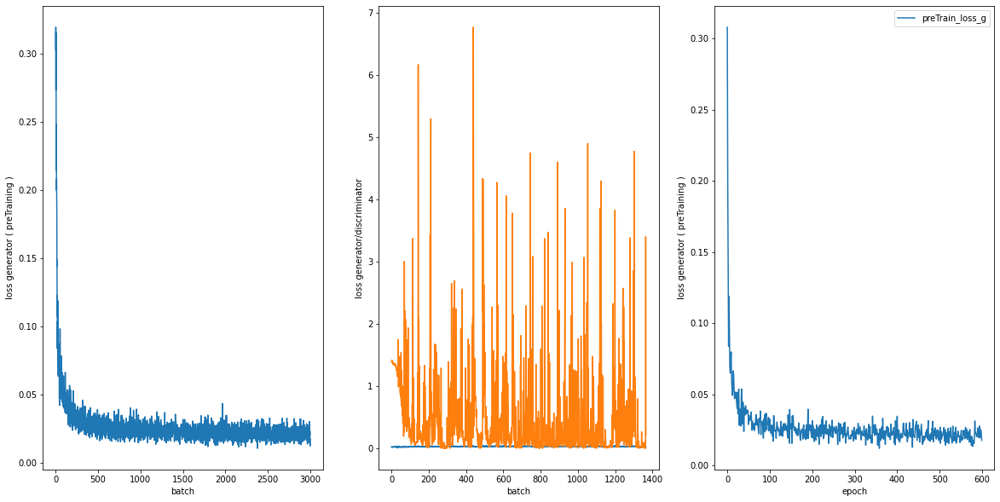

In [37]:
# plot the loss of the generator and discriminator over the training process for the pre-training and fine-tuning
# the loss is saved in a csv files in the progress_measurements folder (per batch and per epoch)

df = pd.read_csv('progress_measurements/bacth_preTrain_generator_loss.csv')
bacth_preTrain_loss_g = df['loss_generator'].to_numpy(dtype=np.float32).flatten()

df = pd.read_csv('progress_measurements/bacth_fineTrain_g_d_loss.csv')
bacth_fineTuneTrain_loss_g = df['loss_generator'].to_numpy(dtype=np.float32).flatten() 
bacth_fineTuneTrain_loss_d = df['loss_discriminator'].to_numpy(dtype=np.float32).flatten()

df = pd.read_csv('progress_measurements/epoch_preTrain_generator_loss.csv')
epoch_preTrain_loss_g = df['loss_generator'].to_numpy(dtype=np.float32).flatten()

# df = pd.read_csv('progress_measurements/epoch_fineTrain_g_d_loss.csv')
# print(df)
# epoch_fineTuneTrain_loss_g = df['loss_generator'].to_numpy(dtype=np.float32).flatten() 
# epoch_fineTuneTrain_loss_d = df['loss_discriminator'].to_numpy(dtype=np.float32).flatten() 


fig , axes = plt.subplots(1,3,figsize=(20,10))
# fig , axes = plt.subplots(2,2,figsize=(20,10))


axes[0].plot(bacth_preTrain_loss_g, label='preTrain_loss_g')
axes[0].set_xlabel('batch')
axes[0].set_ylabel('loss generator ( preTraining )')

axes[1].plot(bacth_fineTuneTrain_loss_g, label='fineTuneTrain_loss_g')
axes[1].plot(bacth_fineTuneTrain_loss_d, label='fineTuneTrain_loss_d')
axes[1].set_xlabel('batch')
axes[1].set_ylabel('loss generator/discriminator')

axes[2].plot(epoch_preTrain_loss_g, label='preTrain_loss_g')
axes[2].set_xlabel('epoch')
axes[2].set_ylabel('loss generator ( preTraining )')

# axes[1,1].plot(epoch_fineTuneTrain_loss_g, label='fineTuneTrain_loss_g')
# axes[1,1].plot(epoch_fineTuneTrain_loss_d, label='fineTuneTrain_loss_d')
# axes[1,1].set_xlabel('epoch')
# axes[1,1].set_ylabel('loss generator/discriminator')

plt.legend()
plt.show()

In [38]:
# the indecies of the images to compare over different models throught out the testing process
IMAGES_TO_COMPARE_INDECIES = [4,7,9]

In [39]:
# test the model after 2 epoches of pretraining and fintuning, for later comparison 
args = Args()

args.mode = 'test'
args.LR_path = 'test_data/realistic_nature_100/test_LR/'
args.GT_path = 'test_data/realistic_nature_100/test_HR/'
# the fine-tuned model of only 2_epoches
args.generator_path = 'model/SRGAN_gene_002.pt'
args.result_images_marker = 'fineTuned_g_002_'

psnr_results_fineTuned_002 , psnr_mean_fineTuned_002 = test(args)

test_only (generating HR images): 10it [00:03,  3.28it/s]


low resolution images : 
shapes :  [[96 96  3]]
all_of_same_shape :  True
high resolution images : 
shapes :  [[384 384   3]]
all_of_same_shape :  True
result images : 
shapes :  [[384 384   3]]
all_of_same_shape :  True


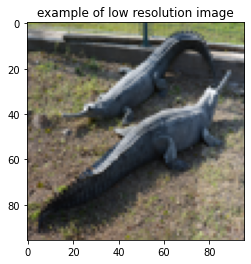

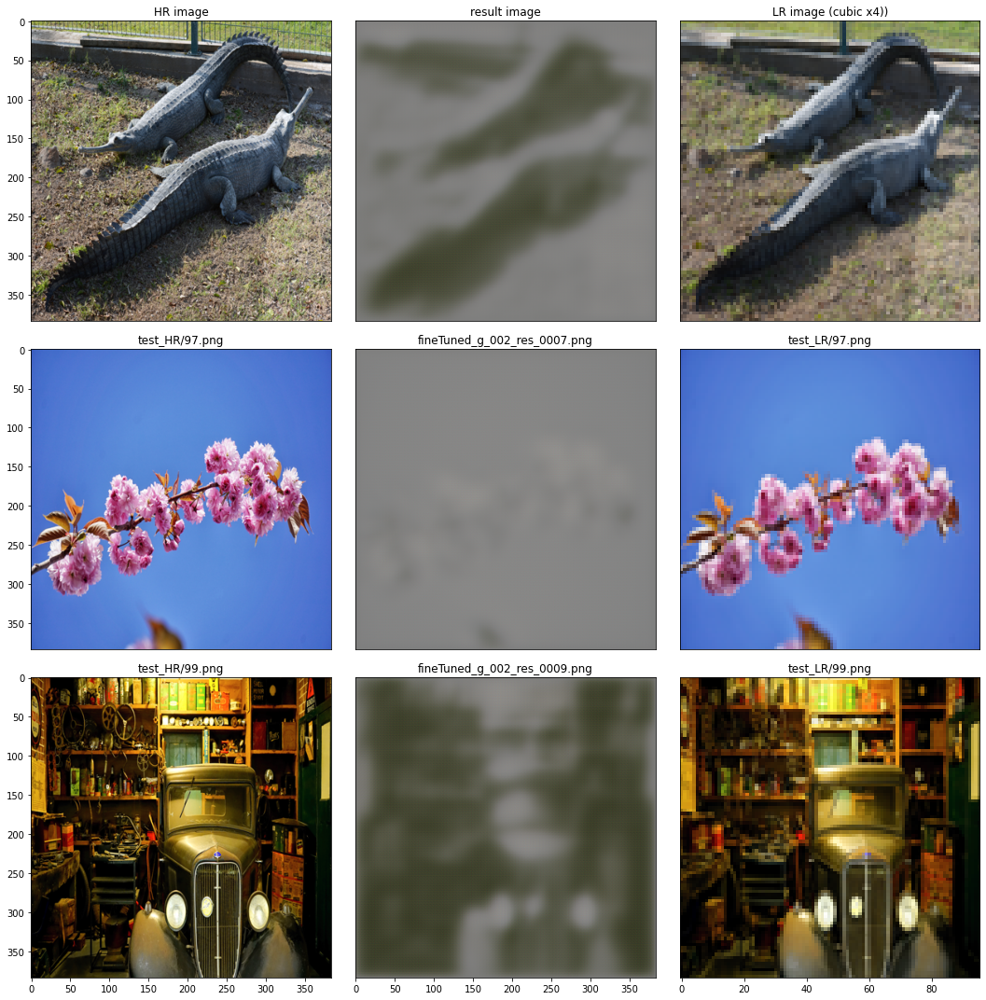

In [40]:
# plot the test and result images ( for the fine-tuned model of only 2_epoches )
inspect_data(HR_path ='test_data/realistic_nature_100/test_HR/',
             LR_path ='test_data/realistic_nature_100/test_LR/',
             result_path='result_images/',
             type_end ='.png',
             result_imgs_prefix='fineTuned_g_002_',
             imgs_indecies=IMAGES_TO_COMPARE_INDECIES)

PSNR mean of fine tuned model for 2 epochs :  15.422196633053582


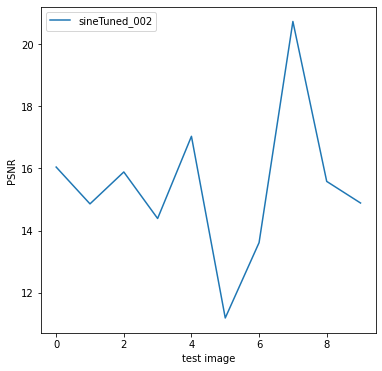

In [41]:
# plot the PSNR of the test images
print('PSNR mean of fine tuned model for 2 epochs : ', psnr_mean_fineTuned_002)

fig , ax = plt.subplots(figsize=(6,6))
ax.plot(psnr_results_fineTuned_002, label='sineTuned_002')
ax.set_xlabel('test image')
ax.set_ylabel('PSNR')
plt.legend()
plt.show()

In [42]:
## test the trained model of the head strat generator 
# (600 epoches of training without the discriminator)
# create an instance of the arguments class and set the parameters for testing
args = Args()

args.mode = 'test'
args.LR_path = 'test_data/realistic_nature_100/test_LR/'
args.GT_path = 'test_data/realistic_nature_100/test_HR/'
# head start generator
args.generator_path = 'model/pre_trained_model_600.pt'
args.result_images_marker = 'headStart_g_600_'

psnr_results_headStart_generator , psnr_mean_headStart_generator = test(args)

test_only (generating HR images): 10it [00:03,  3.25it/s]


low resolution images : 
shapes :  [[96 96  3]]
all_of_same_shape :  True
high resolution images : 
shapes :  [[384 384   3]]
all_of_same_shape :  True
result images : 
shapes :  [[384 384   3]]
all_of_same_shape :  True


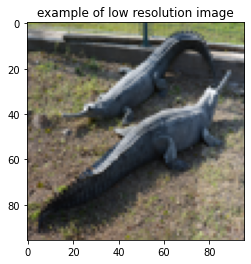

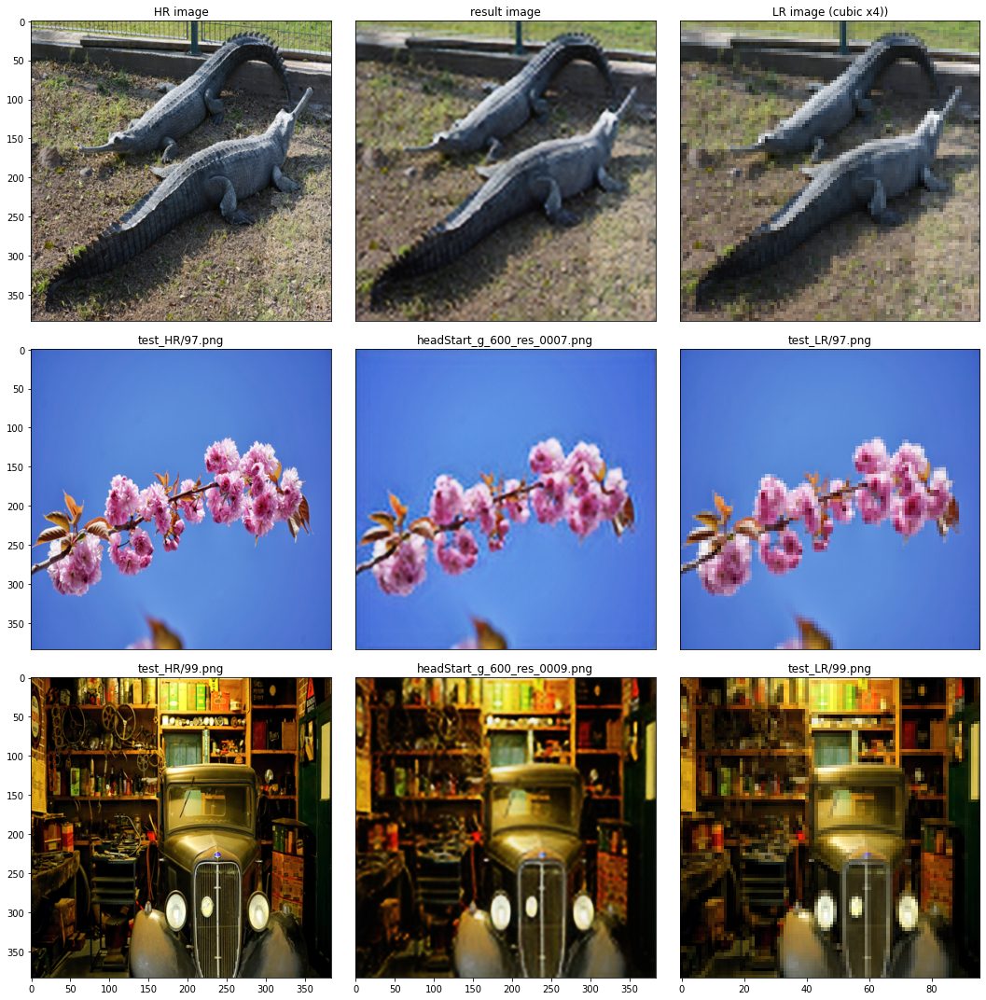

In [43]:
# plot the test and result images ( for the head start generator of 600 epoches )
inspect_data(HR_path ='test_data/realistic_nature_100/test_HR/',
             LR_path ='test_data/realistic_nature_100/test_LR/',
             result_path='result_images/',
             type_end ='.png',
             result_imgs_prefix='headStart_g_600_',
             imgs_indecies=IMAGES_TO_COMPARE_INDECIES)

PSNR mean of headStart generator :  24.0495352875432


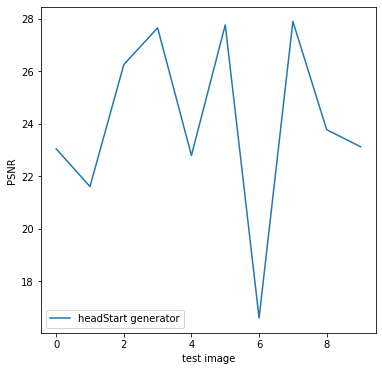

In [44]:
# plot the PSNR of the test images
print('PSNR mean of headStart generator : ', psnr_mean_headStart_generator)

fig , ax = plt.subplots(figsize=(6,6))
ax.plot(psnr_results_headStart_generator, label='headStart generator')
ax.set_xlabel('test image')
ax.set_ylabel('PSNR')
plt.legend()
plt.show()

In [45]:
## test the trained model of the fine tuned generator 
# (600 epoches of pre training without discriminator and 300 epoches of fine tuning with discriminator)
# create an instance of the arguments class and set the parameters for testing
args = Args()

args.mode = 'test'
args.LR_path = 'test_data/realistic_nature_100/test_LR/'
args.GT_path = 'test_data/realistic_nature_100/test_HR/'
# fine tuned generator (model)
args.generator_path = 'model/SRGAN_gene_300.pt'
args.result_images_marker = 'fineTuned_g_300_'

psnr_results_fineTuned , psnr_mean_fineTuned = test(args)

test_only (generating HR images): 10it [00:02,  3.81it/s]


low resolution images : 
shapes :  [[96 96  3]]
all_of_same_shape :  True
high resolution images : 
shapes :  [[384 384   3]]
all_of_same_shape :  True
result images : 
shapes :  [[384 384   3]]
all_of_same_shape :  True


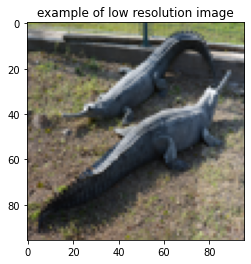

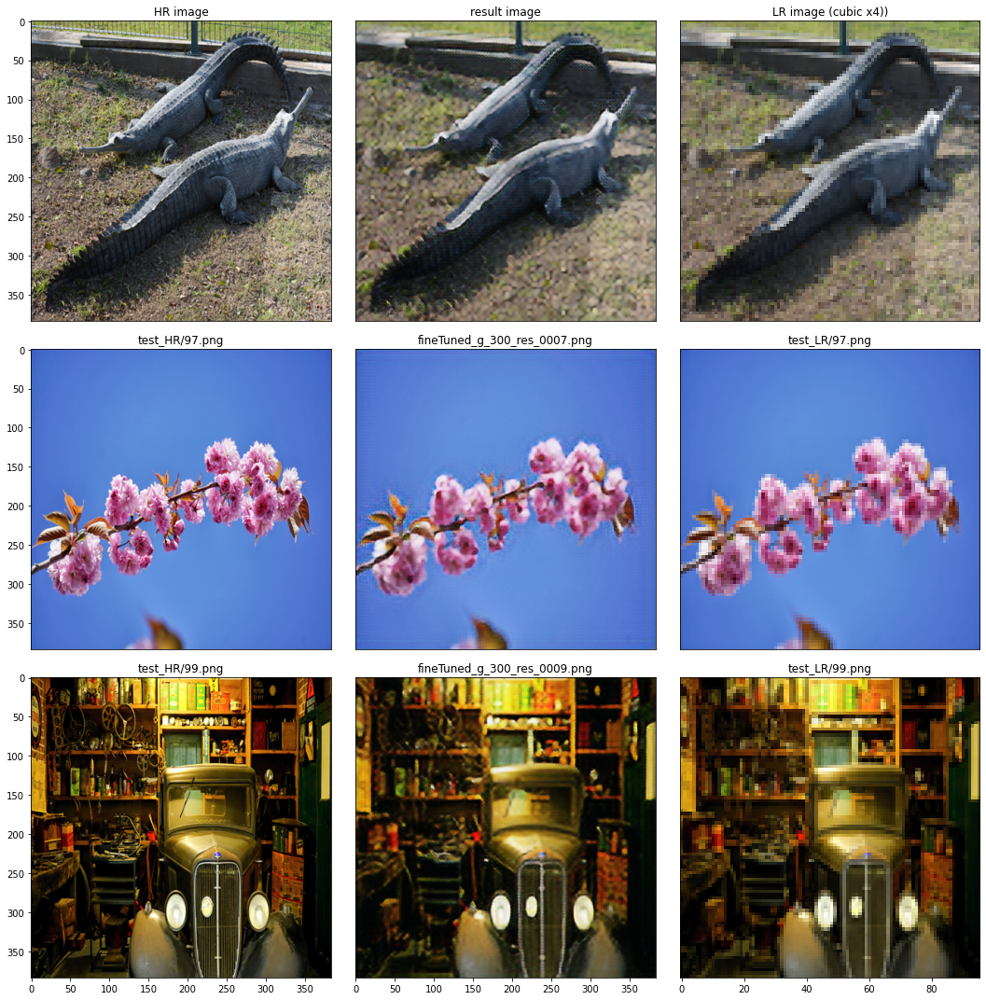

In [46]:
# plot the test and result images ( for the fine_tuned generator of pretrian 600 epoches and fine tune 300 epoches )
inspect_data(HR_path ='test_data/realistic_nature_100/test_HR/',
             LR_path ='test_data/realistic_nature_100/test_LR/',
             result_path='result_images/',
             type_end ='.png',
             result_imgs_prefix='fineTuned_g_300_',
             imgs_indecies=IMAGES_TO_COMPARE_INDECIES)

PSNR mean of fine tuned generator :  23.55615724990691


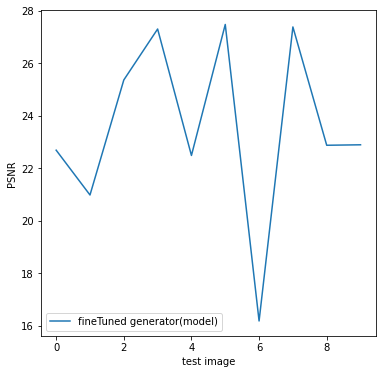

In [47]:
print('PSNR mean of fine tuned generator : ', psnr_mean_fineTuned)

fig , ax = plt.subplots(figsize=(6,6))
ax.plot(psnr_results_fineTuned, label='fineTuned generator(model)')
ax.set_xlabel('test image')
ax.set_ylabel('PSNR')
plt.legend()
plt.show()

In [48]:
## test the a pretrained model for comparison
# create an instance of the arguments class and set the parameters for testing
args = Args()

args.mode = 'test'
args.LR_path = 'test_data/realistic_nature_100/test_LR/'
args.GT_path = 'test_data/realistic_nature_100/test_HR/'
# pretrained model
args.generator_path = 'pretrained_models/SRGAN.pt'
args.result_images_marker = 'pre_trained_'


psnr_results_pretrained , psnr_mean_pretrained = test(args)

test_only (generating HR images): 10it [00:02,  3.65it/s]


low resolution images : 
shapes :  [[96 96  3]]
all_of_same_shape :  True
high resolution images : 
shapes :  [[384 384   3]]
all_of_same_shape :  True
result images : 
shapes :  [[384 384   3]]
all_of_same_shape :  True


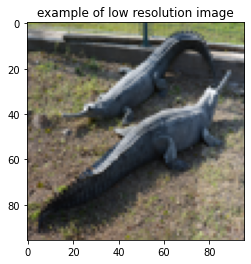

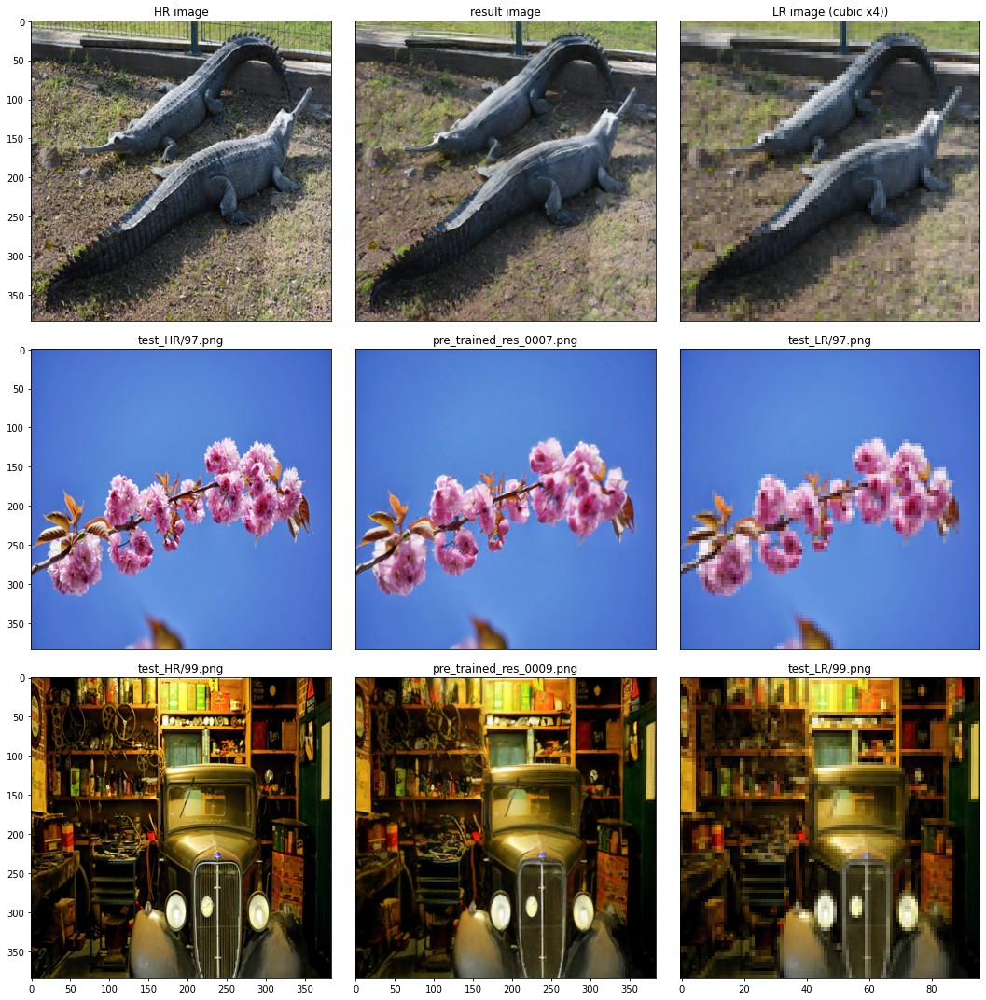

In [49]:
# plot the test and result images ( for the pretrained model )
inspect_data(HR_path ='test_data/realistic_nature_100/test_HR/',
             LR_path ='test_data/realistic_nature_100/test_LR/',
             result_path='result_images/',
             type_end ='.png',
             result_imgs_prefix='pre_trained_',
             imgs_indecies=IMAGES_TO_COMPARE_INDECIES)

PSNR mean pretrained :  24.158223876412283


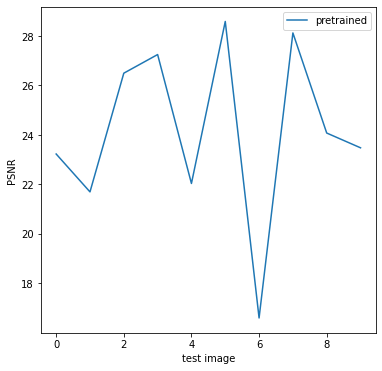

In [50]:
# plot the PSNR of the test images ( for the pretrained model )
print('PSNR mean pretrained : ', psnr_mean_pretrained)
fig , ax = plt.subplots(figsize=(6,6))
ax.plot(psnr_results_pretrained, label='pretrained')
ax.set_xlabel('test image')
ax.set_ylabel('PSNR')
plt.legend()
plt.show()

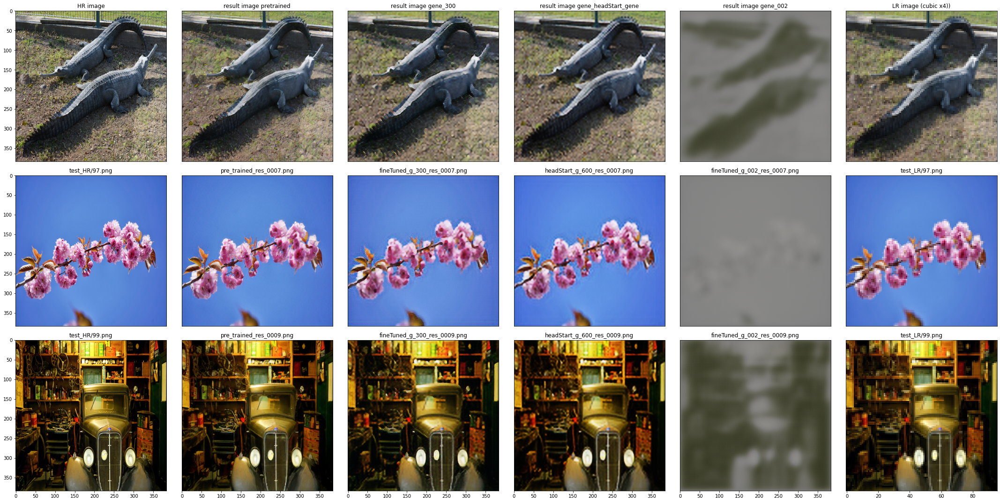

In [51]:
# compare the results of all models together
fig_scale = 5
models_numb = 4

HR_path = 'test_data/realistic_nature_100/test_HR/'
LR_path = 'test_data/realistic_nature_100/test_LR/'
result_path = 'result_images/'
HR_imgs_prefix = ''
LR_imgs_prefix = ''
type_end = '.png'

directory_HR = os.fsencode(HR_path)
directory_LW = os.fsencode(LR_path)

files_HR = os.listdir(directory_HR)
files_LR = os.listdir(directory_LW)
files_HR = [os.fsdecode(file) for file in files_HR if os.fsdecode(file).endswith(type_end) 
                                                    and os.fsdecode(file).startswith(HR_imgs_prefix)]
files_LR = [os.fsdecode(file) for file in files_LR if os.fsdecode(file).endswith(type_end) 
                                                    and os.fsdecode(file).startswith(LR_imgs_prefix)]
files_LR.sort()
files_HR.sort()

directory_result = os.fsencode(result_path)
files_result = os.listdir(directory_result)
files_result.sort()

result_imgs_prefix_gene_002 = 'fineTuned_g_002_'
files_result_gene_002 = [os.fsdecode(file) for file in files_result if os.fsdecode(file).endswith(type_end) 
                                                    and os.fsdecode(file).startswith(result_imgs_prefix_gene_002)]

result_imgs_prefix_headStart_gene = 'headStart_g_600_'
files_result_gene_headStart_gene = [os.fsdecode(file) for file in files_result if os.fsdecode(file).endswith(type_end) 
                                                    and os.fsdecode(file).startswith(result_imgs_prefix_headStart_gene)]

result_imgs_prefix_gene_300 = 'fineTuned_g_300_'
files_result_gene_300 = [os.fsdecode(file) for file in files_result if os.fsdecode(file).endswith(type_end) 
                                                    and os.fsdecode(file).startswith(result_imgs_prefix_gene_300)]

result_imgs_prefix_pretrained = 'pre_trained_'
files_result_pretrained = [os.fsdecode(file) for file in files_result if os.fsdecode(file).endswith(type_end) 
                                                    and os.fsdecode(file).startswith(result_imgs_prefix_pretrained)]

fig , axes = plt.subplots(nrows=len(IMAGES_TO_COMPARE_INDECIES),ncols=models_numb+2,
                          figsize=(fig_scale*(models_numb+2),fig_scale*len(IMAGES_TO_COMPARE_INDECIES)))

for idx, (ax1,ax2,ax3,ax4,ax5,ax6) in enumerate(axes):
    img_HR_name = files_HR[IMAGES_TO_COMPARE_INDECIES[idx]]
    img_LR_name = files_LR[IMAGES_TO_COMPARE_INDECIES[idx]]

    img_HR_title = os.path.basename(os.path.normpath(HR_path)) + '/' + img_HR_name
    img_LR_title = os.path.basename(os.path.normpath(LR_path)) + '/' + img_LR_name

    img_result_name_gene_002            = files_result_gene_002[IMAGES_TO_COMPARE_INDECIES[idx]]
    img_result_name_gene_headStart_gene = files_result_gene_headStart_gene[IMAGES_TO_COMPARE_INDECIES[idx]]
    img_result_name_gene_300            = files_result_gene_300[IMAGES_TO_COMPARE_INDECIES[idx]]
    img_result_name_pretrained          = files_result_pretrained[IMAGES_TO_COMPARE_INDECIES[idx]]

    img_HR = plt.imread(HR_path+img_HR_name)
    img_LR = plt.imread(LR_path+img_LR_name)
    img_result_gene_002         = plt.imread(result_path+img_result_name_gene_002)
    img_result_headStart_gene   = plt.imread(result_path+img_result_name_gene_headStart_gene)
    img_result_gene_300         = plt.imread(result_path+img_result_name_gene_300)
    img_result_pretrained       = plt.imread(result_path+img_result_name_pretrained)
    
    ax1.imshow(img_HR)
    ax1.set_title(img_HR_title)
    ax1.xaxis.set_visible(False)
    ax1.yaxis.set_visible(True)

    ax6.imshow(img_LR)
    ax6.set_title(img_LR_title)
    ax6.xaxis.set_visible(False)
    ax6.yaxis.set_visible(False)

    ax2.imshow(img_result_pretrained)
    ax2.set_title(img_result_name_pretrained)
    ax2.xaxis.set_visible(False)
    ax2.yaxis.set_visible(False)

    ax3.imshow(img_result_gene_300)
    ax3.set_title(img_result_name_gene_300)
    ax3.xaxis.set_visible(False)
    ax3.yaxis.set_visible(False)

    ax4.imshow(img_result_headStart_gene)
    ax4.set_title(img_result_name_gene_headStart_gene)
    ax4.xaxis.set_visible(False)
    ax4.yaxis.set_visible(False)

    ax5.imshow(img_result_gene_002)
    ax5.set_title(img_result_name_gene_002)
    ax5.xaxis.set_visible(False)
    ax5.yaxis.set_visible(False)

    if idx == len(IMAGES_TO_COMPARE_INDECIES)-1:
        ax1.xaxis.set_visible(True)
        ax2.xaxis.set_visible(True)
        
        ax3.xaxis.set_visible(True)
        ax4.xaxis.set_visible(True)
        ax5.xaxis.set_visible(True)
        ax6.xaxis.set_visible(True)
    if idx == 0:
        ax1.set_title('HR image')
        ax6.set_title('LR image (cubic x4))')

        ax2.set_title('result image pretrained')
        ax3.set_title('result image gene_300')
        ax4.set_title('result image gene_headStart_gene')
        ax5.set_title('result image gene_002')


plt.tight_layout()
plt.show()

PSNR mean gene_002 :  15.422196633053582
PSNR mean gene_headStart_gene :  24.0495352875432
PSNR mean gene_300 :  23.55615724990691
PSNR mean pretrained :  24.158223876412283


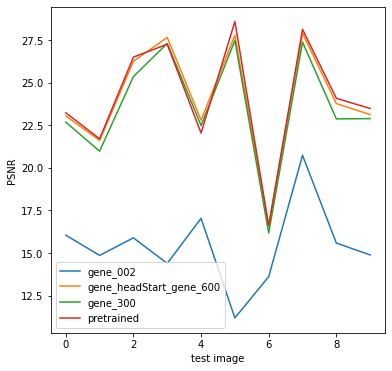

In [52]:
# plot the PSNR of the test images from all models together
print('PSNR mean gene_002 : ', psnr_mean_fineTuned_002)
print('PSNR mean gene_headStart_gene : ', psnr_mean_headStart_generator)
print('PSNR mean gene_300 : ', psnr_mean_fineTuned)
print('PSNR mean pretrained : ', psnr_mean_pretrained)

fig , ax = plt.subplots(figsize=(6,6))
ax.plot(psnr_results_fineTuned_002, label='gene_002')
ax.plot(psnr_results_headStart_generator, label='gene_headStart_gene_600')
ax.plot(psnr_results_fineTuned, label='gene_300')
ax.plot(psnr_results_pretrained, label='pretrained')
ax.set_xlabel('test image')
ax.set_ylabel('PSNR')
plt.legend()
plt.show()